### Example 1 - Covid Data- 2021-2022

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import chart_studio.plotly as py
import plotly.offline as po
import plotly.graph_objs as pg
import plotly.express as px

In [2]:
df = pd.read_csv('covid_2021_2022.csv')

In [3]:
df

,Unnamed: 0,Country,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,312,AFG,Asia,Afghanistan,2021-01-01,52513.0,183.0,131.143,2201.0,12.0,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,313,AFG,Asia,Afghanistan,2021-01-02,52586.0,73.0,117.429,2211.0,10.0,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,314,AFG,Asia,Afghanistan,2021-01-03,52709.0,123.0,123.000,2221.0,10.0,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,315,AFG,Asia,Afghanistan,2021-01-04,52909.0,200.0,128.857,2230.0,9.0,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,316,AFG,Asia,Afghanistan,2021-01-05,53011.0,102.0,123.429,2237.0,7.0,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104332,171112,ZWE,Africa,Zimbabwe,2022-03-21,244685.0,233.0,253.714,5429.0,3.0,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
104333,171113,ZWE,Africa,Zimbabwe,2022-03-22,244685.0,0.0,253.714,5429.0,0.0,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
104334,171114,ZWE,Africa,Zimbabwe,2022-03-23,244958.0,273.0,186.857,5432.0,3.0,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
104335,171115,ZWE,Africa,Zimbabwe,2022-03-24,245194.0,236.0,220.571,5432.0,0.0,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [4]:
po.init_notebook_mode(connected = True)

In [5]:
df.columns

Index(['Unnamed: 0', 'Country', 'continent', 'location', 'date', 'total_cases',
       'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothe

In [7]:
fig = px.choropleth(df, locations="Country",color='new_cases',
                     hover_name="location",
                     projection="natural earth",
                     color_continuous_scale="RdYlGn",
                     animation_frame="date")
fig.show()

### Example 2 - Indian Population Density

In [31]:
import plotly.io as pio
import json

In [32]:
pio.renderers.default = 'iframe'
indian_states = json.load(open("states_india.geojson", "r"))

In [33]:
state_id_map = {}
for feature in indian_states["features"]:
    feature["id"] = feature["properties"]["state_code"]
    state_id_map[feature["properties"]["st_nm"]] = feature["id"]

In [34]:
state_id_map

{'Telangana': 0,
 'Andaman & Nicobar Island': 35,
 'Andhra Pradesh': 28,
 'Arunanchal Pradesh': 12,
 'Assam': 18,
 'Bihar': 10,
 'Chhattisgarh': 22,
 'Daman & Diu': 25,
 'Goa': 30,
 'Gujarat': 24,
 'Haryana': 6,
 'Himachal Pradesh': 2,
 'Jammu & Kashmir': 1,
 'Jharkhand': 20,
 'Karnataka': 29,
 'Kerala': 32,
 'Lakshadweep': 31,
 'Madhya Pradesh': 23,
 'Maharashtra': 27,
 'Manipur': 14,
 'Chandigarh': 4,
 'Puducherry': 34,
 'Punjab': 3,
 'Rajasthan': 8,
 'Sikkim': 11,
 'Tamil Nadu': 33,
 'Tripura': 16,
 'Uttar Pradesh': 9,
 'Uttarakhand': 5,
 'West Bengal': 19,
 'Odisha': 21,
 'Dadara & Nagar Havelli': 26,
 'Meghalaya': 17,
 'Mizoram': 15,
 'Nagaland': 13,
 'NCT of Delhi': 7}

In [35]:
df = pd.read_csv("india_census.csv")
df["Density"] = df["Density[a]"].apply(lambda x: int(x.split("/")[0].replace(",", "")))
df["id"] = df["State or union territory"].apply(lambda x: state_id_map[x])

In [36]:
df.head()

,Rank,State or union territory,Population,Population (%),Decadal growth(2001–2011),Rural population,Percent rural,Urban population,Percent urban,Area[16],Density[a],Sex ratio,Density,id
0,1.0,Uttar Pradesh,199812341,NaN,20.20%,155317278,NaN,44495063,NaN,"240,928 km2 (93,023 sq mi)","828/km2 (2,140/sq mi)",912,828,9
1,2.0,Maharashtra,112374333,NaN,20.00%,61556074,NaN,50818259,NaN,"307,713 km2 (118,809 sq mi)",365/km2 (950/sq mi),929,365,27
2,3.0,Bihar,104099452,NaN,25.40%,92341436,NaN,11758016,NaN,"94,163 km2 (36,357 sq mi)","1,102/km2 (2,850/sq mi)",918,1102,10
3,4.0,West Bengal,91276115,NaN,13.80%,62183113,NaN,29093002,NaN,"88,752 km2 (34,267 sq mi)","1,029/km2 (2,670/sq mi)",953,1029,19
4,5.0,Madhya Pradesh,72626809,NaN,16.30%,52557404,NaN,20069405,NaN,"308,245 km2 (119,014 sq mi)",236/km2 (610/sq mi),931,236,23


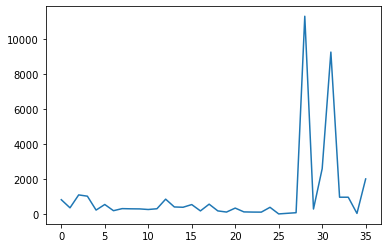

In [37]:
df["Density"].plot()

In [38]:
df["DensityScale"] = np.log10(df["Density"])

In [39]:
fig = px.choropleth(
    df,
    locations="id",
    geojson=indian_states,
    color="DensityScale",
    hover_name="State or union territory",
    hover_data=["Density"],
    title="India Population Density",
)
fig.update_geos(fitbounds="locations", visible=False)
fig.show()